In [67]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns

In [68]:
df_2022 = pd.read_csv('../datasets/acidentes2022.csv', encoding='latin1', sep=';')
df_2023 = pd.read_csv('../datasets/datatran2023.csv', encoding='latin1', sep=';')
df_2024 = pd.read_csv('../datasets/datatran2024.csv', encoding='latin1', sep=';')
df_2025 = pd.read_csv('../datasets/datatran2025.csv', encoding='latin1', sep=';')

In [69]:
df_2022.columns.difference(df_2023.columns)

Index(['ano_fabricacao_veiculo', 'estado_fisico', 'id_veiculo', 'idade',
       'marca', 'pesid', 'sexo', 'tipo_envolvido', 'tipo_veiculo'],
      dtype='object')

In [70]:
df_2023.columns.difference(df_2022.columns)

Index(['feridos', 'ignorados', 'pessoas', 'veiculos'], dtype='object')

In [71]:
df_2023.columns

Index(['id', 'data_inversa', 'dia_semana', 'horario', 'uf', 'br', 'km',
       'municipio', 'causa_acidente', 'tipo_acidente',
       'classificacao_acidente', 'fase_dia', 'sentido_via',
       'condicao_metereologica', 'tipo_pista', 'tracado_via', 'uso_solo',
       'pessoas', 'mortos', 'feridos_leves', 'feridos_graves', 'ilesos',
       'ignorados', 'feridos', 'veiculos', 'latitude', 'longitude', 'regional',
       'delegacia', 'uop'],
      dtype='object')

Como podemos ver, há algumas colunas que o dataframe de 2022 têm que os de 2023 adiante não têm. Porém, muitas informações são dados que seriam de saída, que não estamos interessados em predizer.

In [72]:
df_2022 = df_2022.drop(['ano_fabricacao_veiculo', 'estado_fisico', 'id_veiculo', 'idade',
              'marca', 'pesid', 'sexo', 'tipo_envolvido', 'tipo_veiculo', 'causa_acidente',
              'classificacao_acidente', 'fase_dia', 'sentido_via', 'tipo_pista',
              'tracado_via', 'uso_solo', 'regional', 'delegacia', 'uop'],
              axis=1)
df_2023 = df_2023.drop(['feridos', 'ignorados', 'pessoas', 'veiculos', 'causa_acidente', 'classificacao_acidente',
              'fase_dia', 'sentido_via', 'tipo_pista', 'tracado_via', 'uso_solo', 'regional', 'delegacia', 'uop'],
              axis=1)
df_2024 = df_2024.drop(['feridos', 'ignorados', 'pessoas', 'veiculos', 'causa_acidente', 'classificacao_acidente',
              'fase_dia', 'sentido_via', 'tipo_pista', 'tracado_via', 'uso_solo', 'regional', 'delegacia', 'uop'],
              axis=1)
df_2025 = df_2025.drop(['feridos', 'ignorados', 'pessoas', 'veiculos', 'causa_acidente', 'classificacao_acidente',
              'fase_dia', 'sentido_via', 'tipo_pista', 'tracado_via', 'uso_solo', 'regional', 'delegacia', 'uop'],
              axis=1)

In [73]:
df = pd.concat([df_2022, df_2023, df_2024, df_2025])
df.columns

Index(['id', 'data_inversa', 'dia_semana', 'horario', 'uf', 'br', 'km',
       'municipio', 'tipo_acidente', 'condicao_metereologica', 'ilesos',
       'feridos_leves', 'feridos_graves', 'mortos', 'latitude', 'longitude'],
      dtype='object')

In [74]:
df

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,tipo_acidente,condicao_metereologica,ilesos,feridos_leves,feridos_graves,mortos,latitude,longitude
0,405151.0,2022-01-01,sábado,01:35:00,PI,316,415,MARCOLANDIA,Colisão traseira,Nublado,1,0,0,0,"-7,43280012","-40,68261908"
1,405158.0,2022-01-01,sábado,02:40:00,PR,116,33,CAMPINA GRANDE DO SUL,Tombamento,Nublado,0,0,0,1,"-25,114403","-48,8467554"
2,405158.0,2022-01-01,sábado,02:40:00,PR,116,33,CAMPINA GRANDE DO SUL,Tombamento,Nublado,0,1,0,0,"-25,114403","-48,8467554"
3,405172.0,2022-01-01,sábado,05:22:00,MS,163,393,NOVA ALVORADA DO SUL,Colisão traseira,Céu Claro,1,0,0,0,"-21,228445","-54,456296"
4,405203.0,2022-01-01,sábado,07:00:00,RJ,101,457,ANGRA DOS REIS,Colisão frontal,Chuva,1,0,0,0,"-23,03149804","-44,17715297"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22494,691580.0,2025-04-30,quarta-feira,16:55:00,PR,116,117,CURITIBA,Colisão traseira,Céu Claro,2,1,0,0,"-25,560317","-49,30772"
22495,691606.0,2025-04-07,segunda-feira,06:55:00,PB,230,469,SOUSA,Colisão transversal,Céu Claro,1,1,1,0,"-6,791722","-38,288207"
22496,691678.0,2025-03-07,sexta-feira,12:40:00,RS,116,223,DOIS IRMAOS,Colisão frontal,Céu Claro,0,1,1,0,"-29,586668","-51,098856"
22497,691791.0,2025-04-23,quarta-feira,07:50:00,PR,376,"602,5",CURITIBA,Colisão traseira,Céu Claro,1,1,0,0,"-25,52314427","-49,33240978"


### Análise exploratória de dados


In [75]:
print(df.shape)
print(df.info())


(334246, 16)
<class 'pandas.core.frame.DataFrame'>
Index: 334246 entries, 0 to 22498
Data columns (total 16 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   id                      334246 non-null  float64
 1   data_inversa            334246 non-null  object 
 2   dia_semana              334246 non-null  object 
 3   horario                 334246 non-null  object 
 4   uf                      334246 non-null  object 
 5   br                      334246 non-null  int64  
 6   km                      334246 non-null  object 
 7   municipio               334246 non-null  object 
 8   tipo_acidente           334246 non-null  object 
 9   condicao_metereologica  334246 non-null  object 
 10  ilesos                  334246 non-null  int64  
 11  feridos_leves           334246 non-null  int64  
 12  feridos_graves          334246 non-null  int64  
 13  mortos                  334246 non-null  int64  
 14  latitude     

In [76]:
print(df.describe())
print(df.isnull().sum())

                  id             br         ilesos  feridos_leves  \
count  334246.000000  334246.000000  334246.000000  334246.000000   
mean   521509.675461     211.326424       0.714946       0.594643   
std     77452.955672     129.596222       1.337556       0.888712   
min    405147.000000       0.000000       0.000000       0.000000   
25%    460980.000000     101.000000       0.000000       0.000000   
50%    496341.500000     163.000000       1.000000       0.000000   
75%    586440.750000     324.000000       1.000000       1.000000   
max    691875.000000     498.000000      78.000000      83.000000   

       feridos_graves         mortos  
count   334246.000000  334246.000000  
mean         0.190207       0.056865  
std          0.495993       0.276329  
min          0.000000       0.000000  
25%          0.000000       0.000000  
50%          0.000000       0.000000  
75%          0.000000       0.000000  
max         35.000000      37.000000  
id                        0

In [77]:
df.select_dtypes(include='object').nunique()

data_inversa                1216
dia_semana                     7
horario                     1439
uf                            27
km                          9206
municipio                   1985
tipo_acidente                 17
condicao_metereologica        10
latitude                  112894
longitude                 112872
dtype: int64

In [78]:
df.isna().sum()

id                        0
data_inversa              0
dia_semana                0
horario                   0
uf                        0
br                        0
km                        0
municipio                 0
tipo_acidente             0
condicao_metereologica    0
ilesos                    0
feridos_leves             0
feridos_graves            0
mortos                    0
latitude                  0
longitude                 0
dtype: int64

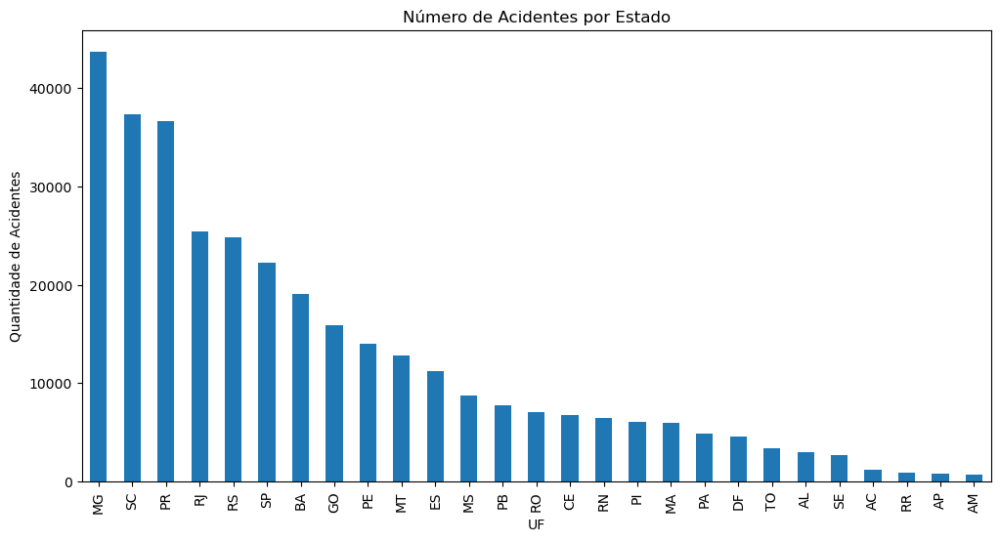

In [79]:
df['uf'].value_counts().plot(kind='bar', figsize=(12,6), title='Número de Acidentes por Estado')
plt.ylabel("Quantidade de Acidentes")
plt.xlabel("UF")
plt.show()

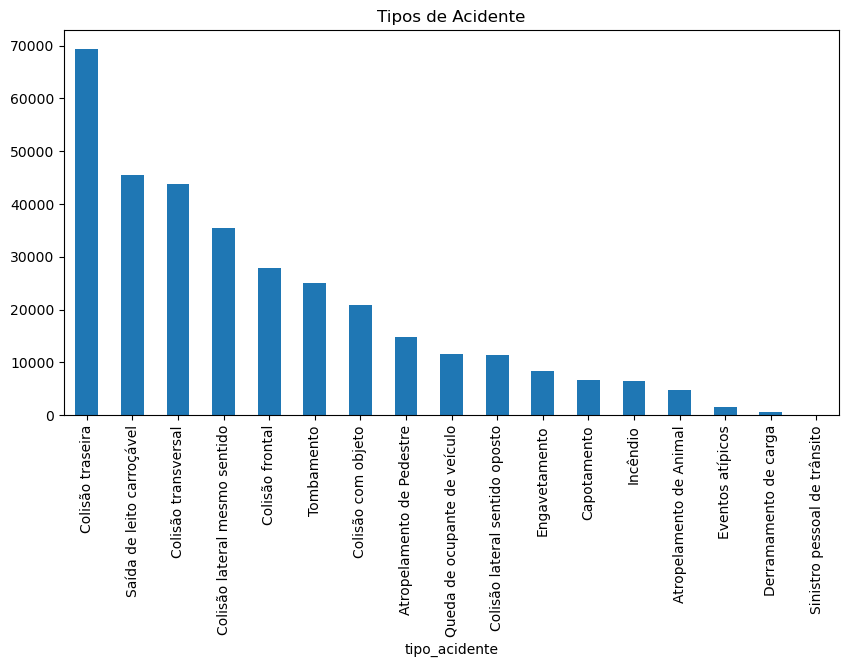

In [80]:
if 'tipo_acidente' in df.columns:
    df['tipo_acidente'].value_counts().plot(kind='bar', figsize=(10,5), title='Tipos de Acidente')
    plt.show()

/tmp/ipykernel_1233/2130801171.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['horario'] = pd.to_datetime(df['horario'], errors='coerce').dt.hour


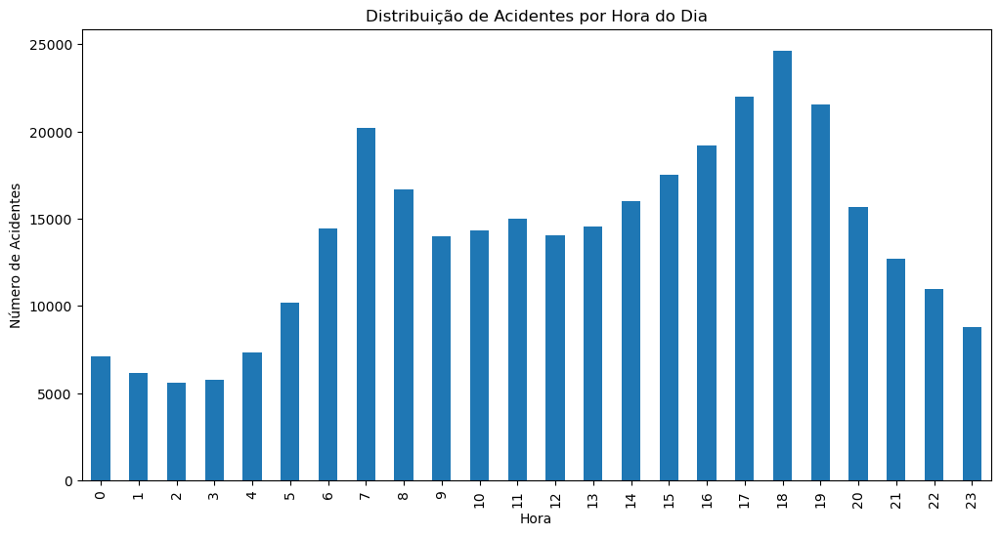

In [81]:
df['horario'] = pd.to_datetime(df['horario'], errors='coerce').dt.hour
df['horario'].value_counts().sort_index().plot(kind='bar', figsize=(12,6), title='Distribuição de Acidentes por Hora do Dia')
plt.xlabel("Hora")
plt.ylabel("Número de Acidentes")
plt.show()

In [82]:
import folium
from folium.plugins import HeatMapWithTime
from folium.plugins import HeatMap
from datetime import datetime
import pandas as pd

In [ ]:
df_map = df[['latitude', 'longitude', 'data_inversa']].dropna().copy()
df_map['latitude'] = df_map['latitude'].str.replace(',', '.', regex=False)
df_map['longitude'] = df_map['longitude'].str.replace(',', '.', regex=False)
df_map['latitude'] = pd.to_numeric(df_map['latitude'], errors='coerce')
df_map['longitude'] = pd.to_numeric(df_map['longitude'], errors='coerce')
df_map['data_inversa'] = pd.to_datetime(df_map['data_inversa'], errors='coerce')
df_map = df_map.dropna(subset=['latitude', 'longitude', 'data_inversa'])
df_map['data_str'] = df_map['data_inversa'].dt.strftime('%Y-%m-%d')
data_grouped = df_map.groupby('data_str')[['latitude', 'longitude']].apply(
    lambda x: x.values.tolist()
)


heat_data = data_grouped.tolist()

time_index = data_grouped.index.tolist()

m = folium.Map(location=[-15.78, -47.93], zoom_start=4, tiles='CartoDB positron')
HeatMapWithTime(
    heat_data,
    index=time_index,
    auto_play=True,
    max_opacity=0.6,
    radius=8
).add_to(m)


m.save('heatmap_temporal_acidentes.html')
m


In [ ]:
df_map = df[['latitude', 'longitude']].dropna().copy()
df_map['latitude'] = df_map['latitude'].str.replace(',', '.', regex=False)
df_map['longitude'] = df_map['longitude'].str.replace(',', '.', regex=False)
df_map['latitude'] = pd.to_numeric(df_map['latitude'], errors='coerce')
df_map['longitude'] = pd.to_numeric(df_map['longitude'], errors='coerce')
df_map = df_map.dropna(subset=['latitude', 'longitude'])

heat_data = df_map[['latitude', 'longitude']].values.tolist()

m = folium.Map(location=[-15.78, -47.93], zoom_start=4, tiles='CartoDB positron')


HeatMap(heat_data, radius=10,blur=0,min_opacity=0.3, max_zoom=13,  gradient={0.2: 'yellow', 0.4: 'orange', 0.6: 'red', 1: 'darkred'} ).add_to(m)

m.save('heatmap_acidentes.html')
m
